In [1]:
import pandas as pd
import altair as alt

alt.data_transformers.disable_max_rows()
alt.renderers.enable("mimetype")

# Load the R cell magic
%load_ext rpy2.ipython

**Read Data**

In [2]:
white_wine = pd.read_csv("../data/winequality-white.csv", sep = ";")
white_wine.shape

(4898, 12)

In [3]:
red_wine = pd.read_csv("../data/winequality-red.csv", sep = ";")
red_wine.shape

(1599, 12)

In [4]:
wine = pd.concat([red_wine, white_wine])
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
wine.shape

(6497, 12)

**Check if there is any null values**

In [7]:
wine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6497 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 659.9 KB


In [8]:
wine.describe(include="all")

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


**Make the target into categorical data type**

In [9]:
wine["quality"].unique()

array([5, 6, 7, 4, 8, 3, 9])

**We can see there there are total of 7 classes, from 3 to 9**

In [10]:
wine["quality"] = wine["quality"].astype("category")

**Some Plots**

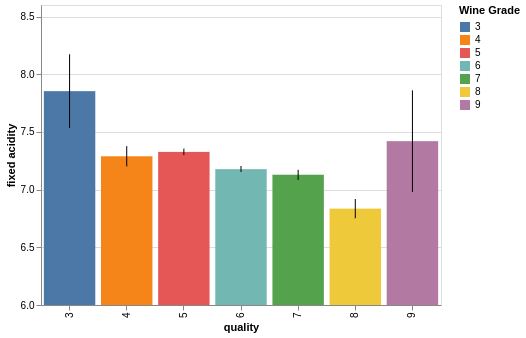

In [11]:
import altair as alt

fixed_acidity = (
    alt.Chart(wine)
    .mark_bar()
    .encode(
        x=alt.X("quality"),
        y=alt.Y("mean(fixed acidity)", scale=alt.Scale(domain=(6, 8.5))),
        color=alt.Color("quality", title="Wine Grade"),
    )
    .properties(width=400)
)

error = (
    alt.Chart(wine)
    .mark_errorbar()
    .encode(x=alt.X("quality"), y=alt.Y("fixed acidity:Q"))
)

fixed_acidity + error

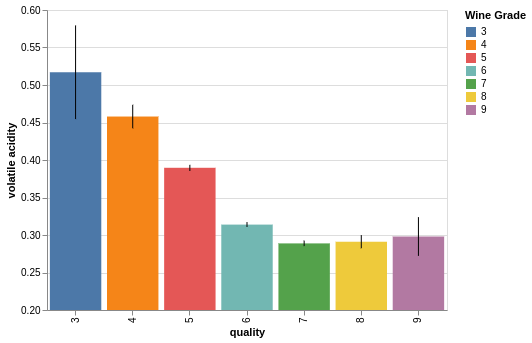

In [12]:
volatile_acidity = (
    alt.Chart(wine)
    .mark_bar()
    .encode(
        x=alt.X("quality"),
        y=alt.Y("mean(volatile acidity)", scale=alt.Scale(domain=(0.2, 0.6))),
        color=alt.Color("quality", title="Wine Grade"),
    )
    .properties(width=400)
)

error = (
    alt.Chart(wine)
    .mark_errorbar()
    .encode(x=alt.X("quality"), y=alt.Y("volatile acidity:Q"))
)

volatile_acidity + error

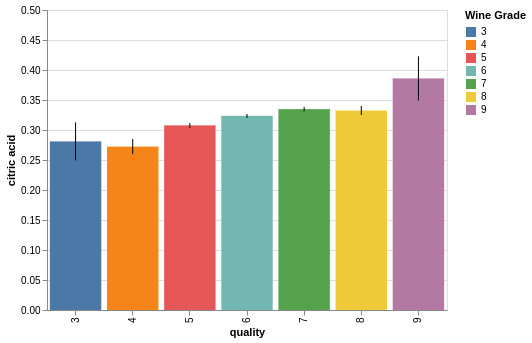

In [13]:
citric_acid = (
    alt.Chart(wine)
    .mark_bar()
    .encode(
        x=alt.X("quality"),
        y=alt.Y("mean(citric acid)", scale=alt.Scale(domain=(0, 0.5))),
        color=alt.Color("quality", title="Wine Grade"),
    )
    .properties(width=400)
)

error = (
    alt.Chart(wine).mark_errorbar().encode(x=alt.X("quality"), y=alt.Y("citric acid:Q"))
)

citric_acid + error

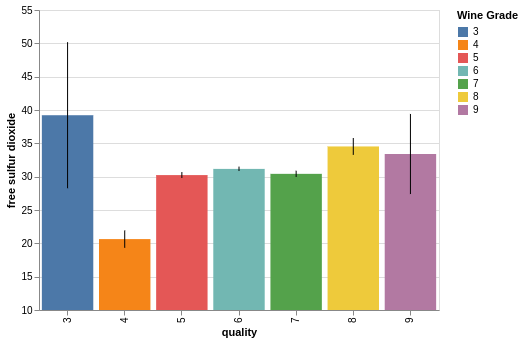

In [14]:
free_sulfur_dioxide = (
    alt.Chart(wine)
    .mark_bar()
    .encode(
        x=alt.X("quality"),
        y=alt.Y("mean(free sulfur dioxide)", scale=alt.Scale(domain=(10, 55))),
        color=alt.Color("quality", title="Wine Grade"),
    )
    .properties(width=400)
)

error = (
    alt.Chart(wine)
    .mark_errorbar()
    .encode(x=alt.X("quality"), y=alt.Y("free sulfur dioxide:Q"))
)

free_sulfur_dioxide + error

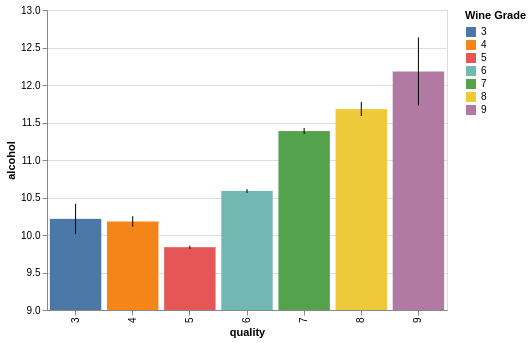

In [15]:
alcohol = (
    alt.Chart(wine)
    .mark_bar()
    .encode(
        x=alt.X("quality"),
        y=alt.Y("mean(alcohol)", scale=alt.Scale(domain=(9, 13))),
        color=alt.Color("quality", title="Wine Grade"),
    )
    .properties(width=400)
)

error = alt.Chart(wine).mark_errorbar().encode(x=alt.X("quality"), y=alt.Y("alcohol:Q"))

alcohol + error

R[write to console]: ── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

R[write to console]: ✔ ggplot2 3.3.2     ✔ purrr   0.3.4
✔ tibble  3.0.3     ✔ dplyr   1.0.1
✔ tidyr   1.1.1     ✔ stringr 1.4.0
✔ readr   1.3.1     ✔ forcats 0.5.0

R[write to console]: ── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

R[write to console]: Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

R[write to console]: Parsed with column specification:
cols(
  `fixed acidity` = col_double(),
  `volatile acidity` = col_double(),
  `citric acid` = col_double(),
  `residual sugar` = col_double(),
  chlorides = col_double(),
  `free sulfur dioxide` = col_double(),
  `total sulfur dioxide` = col_double(),
  density = col_double(),
  pH = col_double(),
  sulphates = col_double(),
  alcohol = col_double(),
  quality = col_double()
)

R[write to c

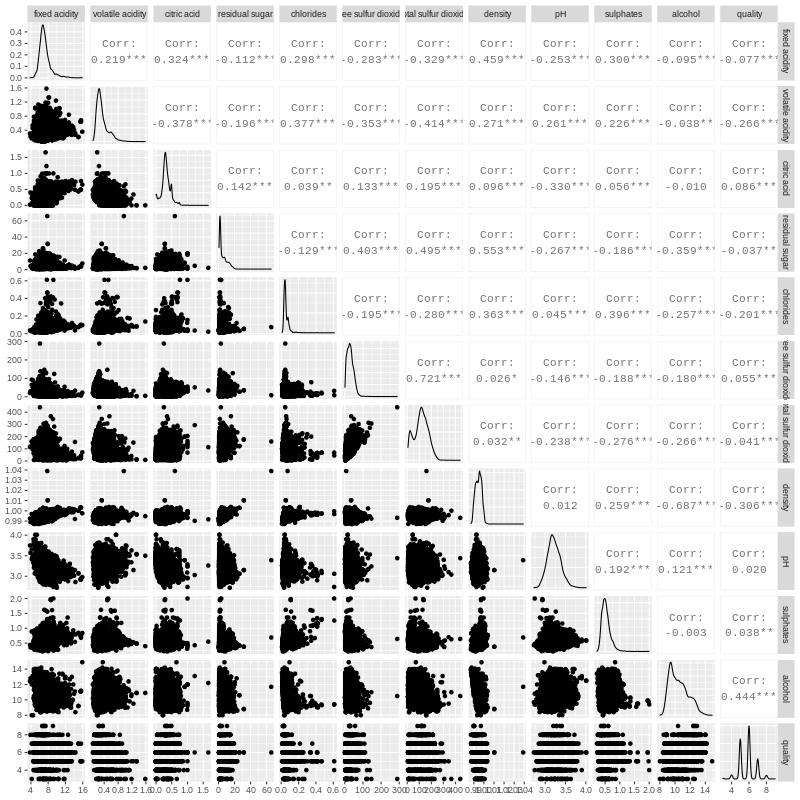

In [16]:
%%R -w 800 -h 800

library(tidyverse)
library(GGally)
white_wine <- read_delim("../data/winequality-white.csv", delim = ";")
red_wine <- read_delim("../data/winequality-red.csv", delim = ";")
wine <- rbind(white_wine, red_wine)

GGally::ggpairs(wine %>% select_if(is.numeric), progress = FALSE)

**Check distribution of our data**

In [17]:
wine["quality"].value_counts()

6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: quality, dtype: int64

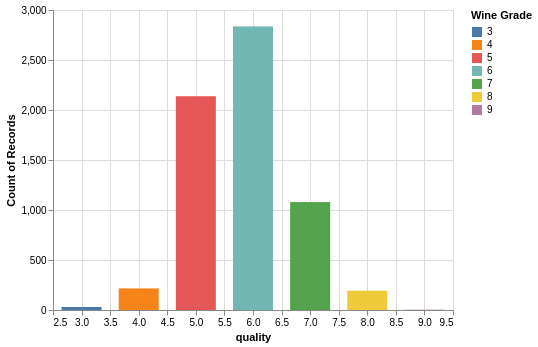

In [18]:
quality_chart = (
    alt.Chart(wine)
    .mark_bar(size=40)
    .encode(
        x=alt.X("quality:O", type="quantitative"),
        y=alt.Y("count()"),
        color=alt.Color("quality", title="Wine Grade"),
    )
)
quality_chart

**We can see that our target is heavily imbalanced, most of wine in this data set are grade 6. Thus, we will have to deal with imbalanced data**

**Split the data**

In [19]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(wine, test_size=0.2, random_state=111)
train_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
3771,6.1,0.27,0.28,9.8,0.042,61.0,125.0,0.99532,3.14,0.42,10.2,6
2750,5.8,0.17,0.34,1.8,0.045,96.0,170.0,0.99035,3.38,0.90,11.8,8
991,8.2,0.26,0.44,1.3,0.046,7.0,69.0,0.99440,3.14,0.62,10.2,4
560,12.7,0.60,0.49,2.8,0.075,5.0,19.0,0.99940,3.14,0.57,11.4,5
1400,7.9,0.69,0.21,2.1,0.080,33.0,141.0,0.99620,3.25,0.51,9.9,5


In [20]:
X_train, y_train = train_df.drop(columns=["quality"]), train_df["quality"]
X_test, y_test = test_df.drop(columns=["quality"]), test_df["quality"]